<font style="font-size:96px; font-weight:bolder; color:#0040a0"><img src="http://montage.ipac.caltech.edu/docs/M51_logo.png" alt="M" style="float: left; padding: 25px 30px 25px 0px;" /></font>

<i><b>Montage</b> is a general astronomical image toolkit with facilities for reprojection, background matching, coaddition and visualization.  It can be used as a set of command-line tools (Linux, OS X and Windows), C library calls (Linux and OS X) and as Python binary extension modules.</i>
    
<i>Montage source code can be downloaded from GitHub ( https://github.com/Caltech-IPAC/Montage ).  The Python package can be installed from PyPI ("pip install MontagePy"). See
http://montage.ipac.caltech.edu/ for more information.</i>

# MontagePy.main modules: mBestImage

Sometimes you may want to find the image in a set that "best" overlaps a specific location on the sky.  Best in this case is defined as the image where the location of interest is farthest from the nearest edge.  In other words, if you were to do a cutout around your location, this is the image that would give the largest area without hitting an edge.

In [1]:
from MontagePy.main import mBestImage, mViewer

help(mBestImage)

Help on built-in function mBestImage in module MontagePy.main:

mBestImage(...)
    Given a list of images and a position, determine which image covers the location 'best' (i.e. the one where the position is farthest from the nearest edge).
    
    Parameters
    ----------
    tblfile : str
        Input image metadata file.
    ra : float
        RA (J2000) of point of interest.
    dec : float
        Dec (J2000) of point of interest.
    debug : int, optional
        Debugging flag.
    
    
    Returns
    -------
    status : int
        Return status (0: OK, 1:ERROR).
    msg : str
        Return message (for errors).
    file : str
        'Best' file name.
    hdu : int
        HDU in file.
    url : str
        URL to file (if available).
    edgedist : float
        Distance from point to nearest edge.



In this example, we have a set of image used to make a mosaic around M17 and we wish to find the image in the set that best covers M17 itself (RA = 275.19629, Dec = -16.17153).

In [2]:
rtn = mBestImage('M17/rimages.tbl', 275.19629, -16.17153)

print(rtn)

{'status': '0', 'file': b'2mass-atlas-990502s-j1430080.fits', 'hdu': 0, 'url': b'', 'edgedist': 0.022766731904283688}


&nbsp;<p/>

Here is the full mosaic, with the input images outlines shown in blue and the location of M17 shown as a black circle:

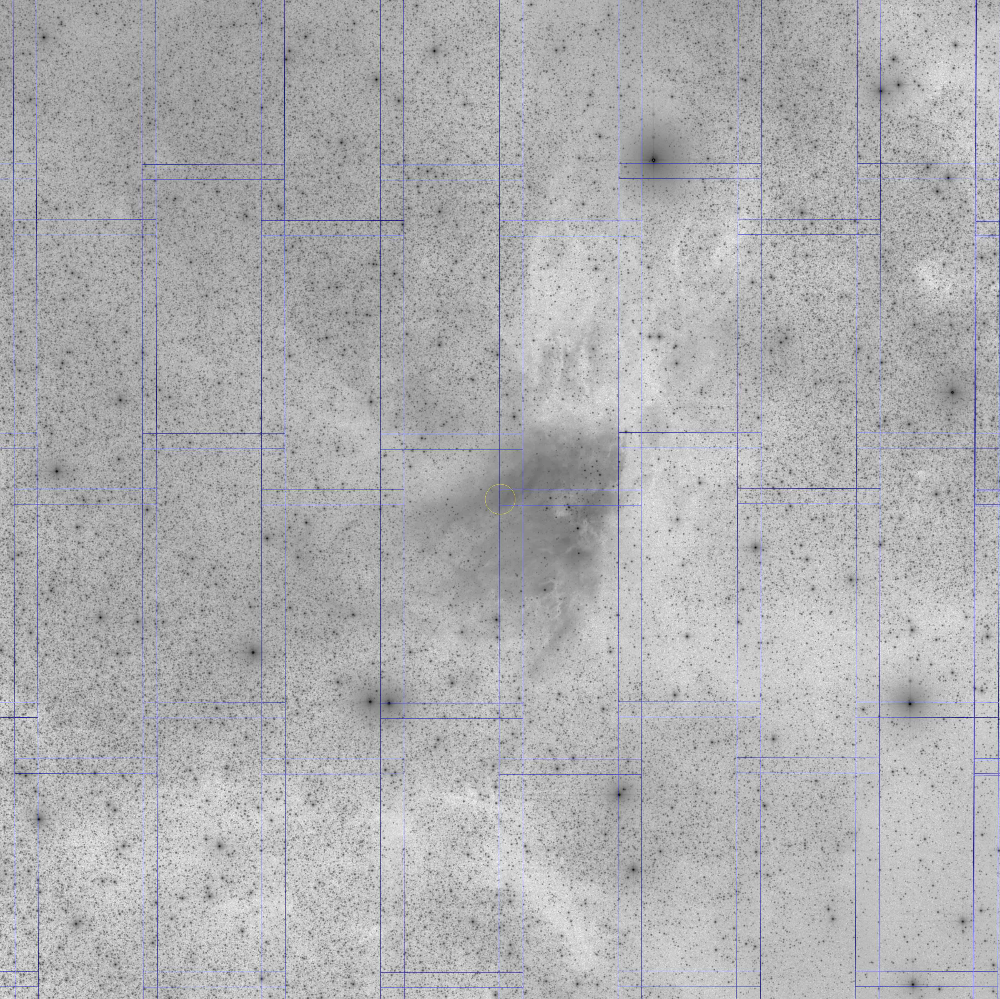

In [3]:
from IPython.display import Image

rtn = mViewer('-color blue -imginfo M17/rimages.tbl \
               -color yellow -symbol 6.0 circle \
               -mark 275.19629 -16.17153 \
               -ct 1 -gray M17/mosaic.fits \
               -2s max gaussian-log -out work/M17/bestimg.png',
              '', mode=2)

Image(filename='work/M17/bestimg.png')


&nbsp;<p/>

and here is the identified "best" image. I have to know how the image list was generated, in this case from the input/raw directory, so that is where the image resides:

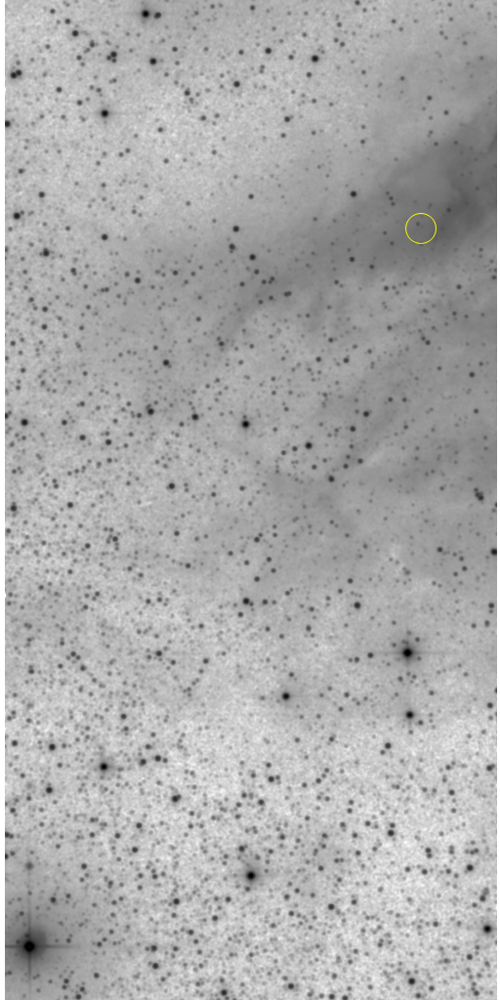

In [4]:
rtn = mViewer('-color yellow -symbol 6.0 circle \
               -mark 275.19629 -16.17153 \
               -ct 1 -gray M17/raw/2mass-atlas-990502s-j1430080.fits \
               -2s max gaussian-log -out work/M17/bestframe.png',
              '', mode=2)

Image(filename='work/M17/bestframe.png')

&nbsp;


## Classic Montage: mBestImage as a Stand-Alone Program

### mBestImage Unix/Windows Command-line Arguments

<p>mBestImage can also be run as a command-line tool in Linux, OS X, and Windows:</p>

<p><tt>
<b>Usage:</b> mBestImage [-d] images.tbl ra dec
</tt></p>
<p>&nbsp;</p>
<p>If you are writing in C/C++, mBestImage can be accessed as a library function:</p>


<pre>
/*-***********************************************************************/
/*                                                                       */
/*  mBestImage                                                           */
/*                                                                       */
/*  Given a list of images and a position, determine which image covers  */
/*  the location 'best' (i.e. the one where the position is farthest     */
/*  from the nearest edge).                                              */
/*                                                                       */
/*   char   *tblfile    Input image metadata file                        */
/*   double  ra         RA (J2000) of point of interest                  */
/*   double  dec        Dec (J2000) of point of interest                 */
/*   int     debug      Debugging flag                                   */
/*                                                                       */
/*************************************************************************/



struct mBestImageReturn *mBestImage(char *tblfile, double ra, double dec, int debug)
</pre>
<p><b>Return Structure</b></p>
<pre>
struct mBestImageReturn
{
   int    status;        // Return status (0: OK, 1:ERROR)
   char   msg [1024];    // Return message (for error return)
   char   json[4096];    // Return parameters as JSON string
   char   file[1024];    // 'Best' file name
   int    hdu;           // Best HDU (if any)
   char   url [1024];    // URL to best file (if any)
   double edgedist;      // Closest edge distance 
};
</pre>